## Import

In [1]:
import math

from sampler import *

import sys
import os
sys.path.append(os.path.join(os.path.dirname(os.getcwd()), ""))

from geometry.geom import Geometry
from geometry.sampler import Sampler
from plot.plot import plot_samples, plot_samples_3d

## Square [0,1]² + time

interior : torch.Size([1500, 3])
boundary 'left': torch.Size([500, 3])
initial  : torch.Size([500, 3])
normal 'left' (first 3):
tensor([[-1., -0.],
        [-1., -0.],
        [-1., -0.]])


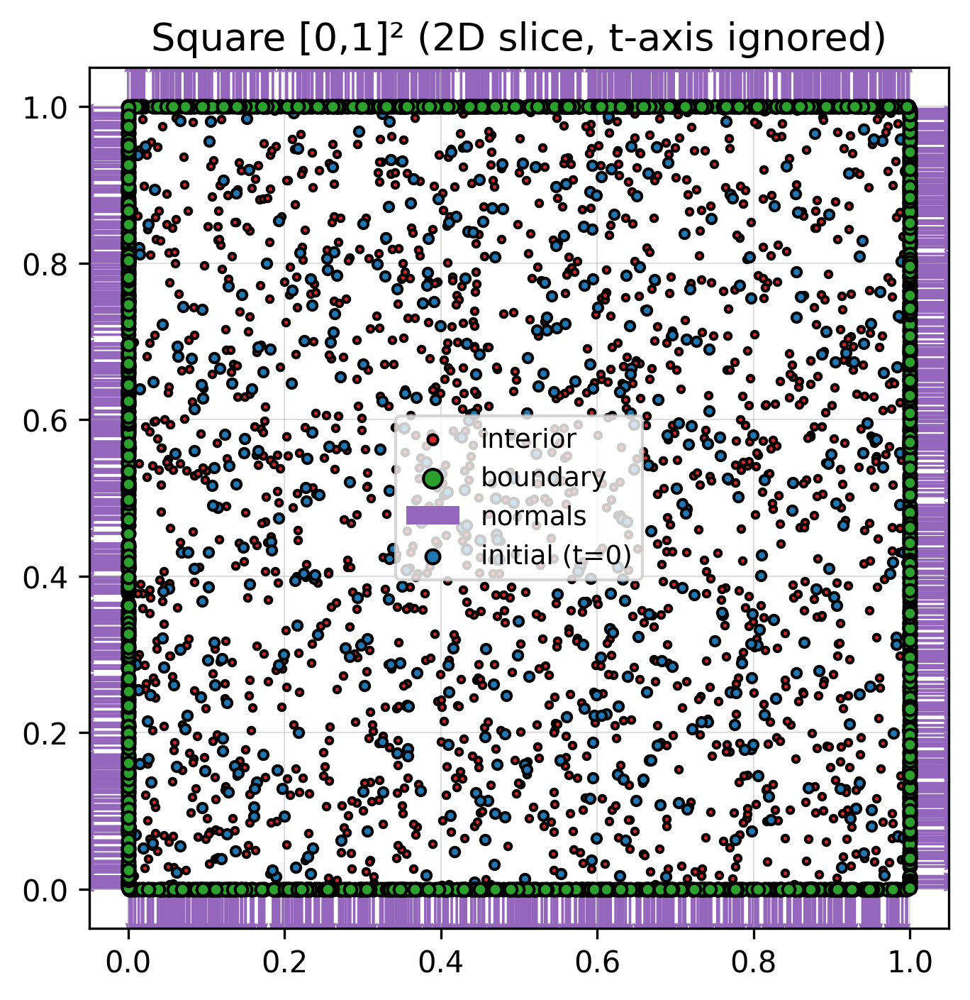

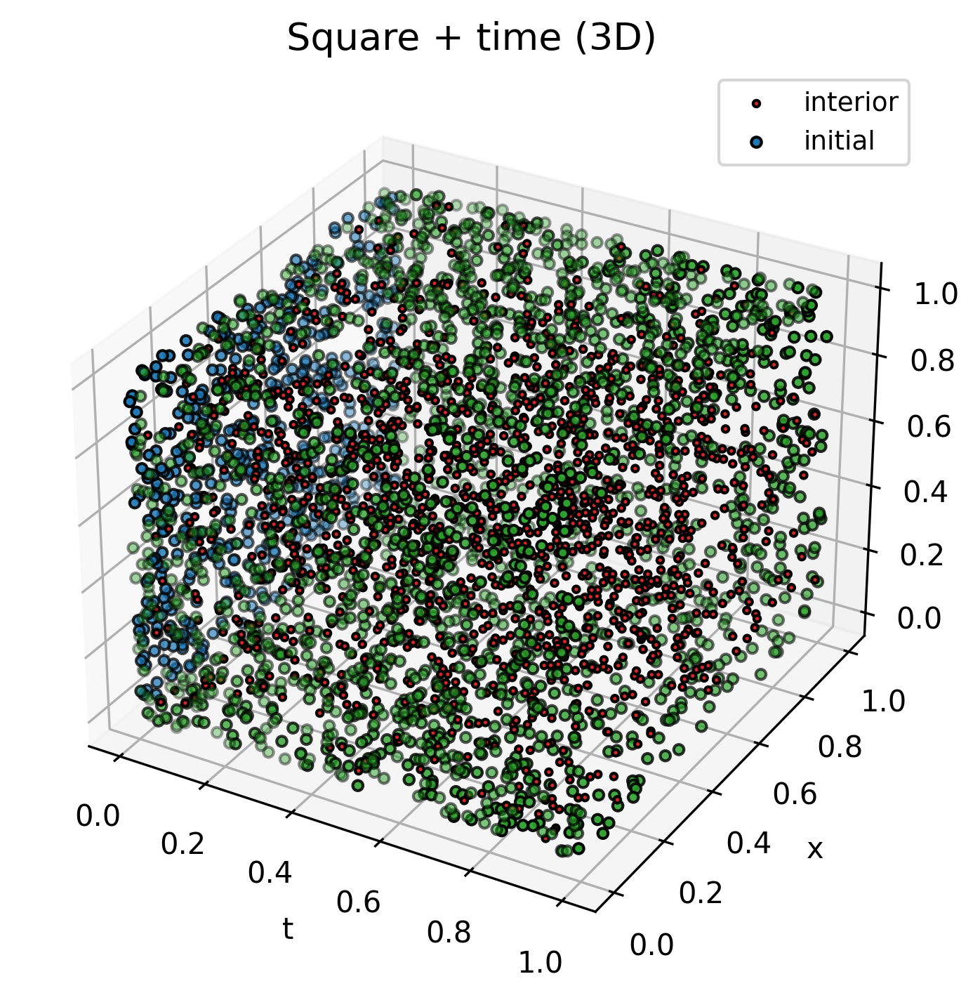

In [2]:
square_bounds = {
    "bottom": {"p": [0.0, 1.0], "x": lambda p: p,       "y": lambda p: 0*p,   },
    "right":  {"p": [0.0, 1.0], "x": lambda p: 0*p + 1, "y": lambda p: p,     },
    "top":    {"p": [0.0, 1.0], "x": lambda p: 1.0 - p, "y": lambda p: 0*p + 1},
    "left":   {"p": [0.0, 1.0], "x": lambda p: 0*p,     "y": lambda p: 1.0 - p},
}

geo_sq = Geometry(square_bounds, dim=2, has_time=True, T=[0.0, 1.0])
samp_sq = Sampler(geo_sq, n_interior=1500, n_boundary=500, n_initial=500, strategy="uniform")
pts_sq = samp_sq.sample()

print("interior :", pts_sq.interior.coords.shape)   # (500, 3)  — [t, y, x]
print("boundary 'left':", pts_sq.boundaries["left"].coords.shape)
print("initial  :", pts_sq.initial.coords.shape)
print("normal 'left' (first 3):")
print(torch.cat([pts_sq.boundaries["left"].nx[:3], pts_sq.boundaries["left"].ny[:3]], dim=1))

plot_samples(pts_sq, title="Square [0,1]² (2D slice, t-axis ignored)")
plot_samples_3d(pts_sq, title="Square + time (3D)")

## Circle r=1

interior : torch.Size([1500, 3])
boundary : torch.Size([500, 3])
norm of normals: min=1.0000  max=1.0000  (must be ≈ 1)


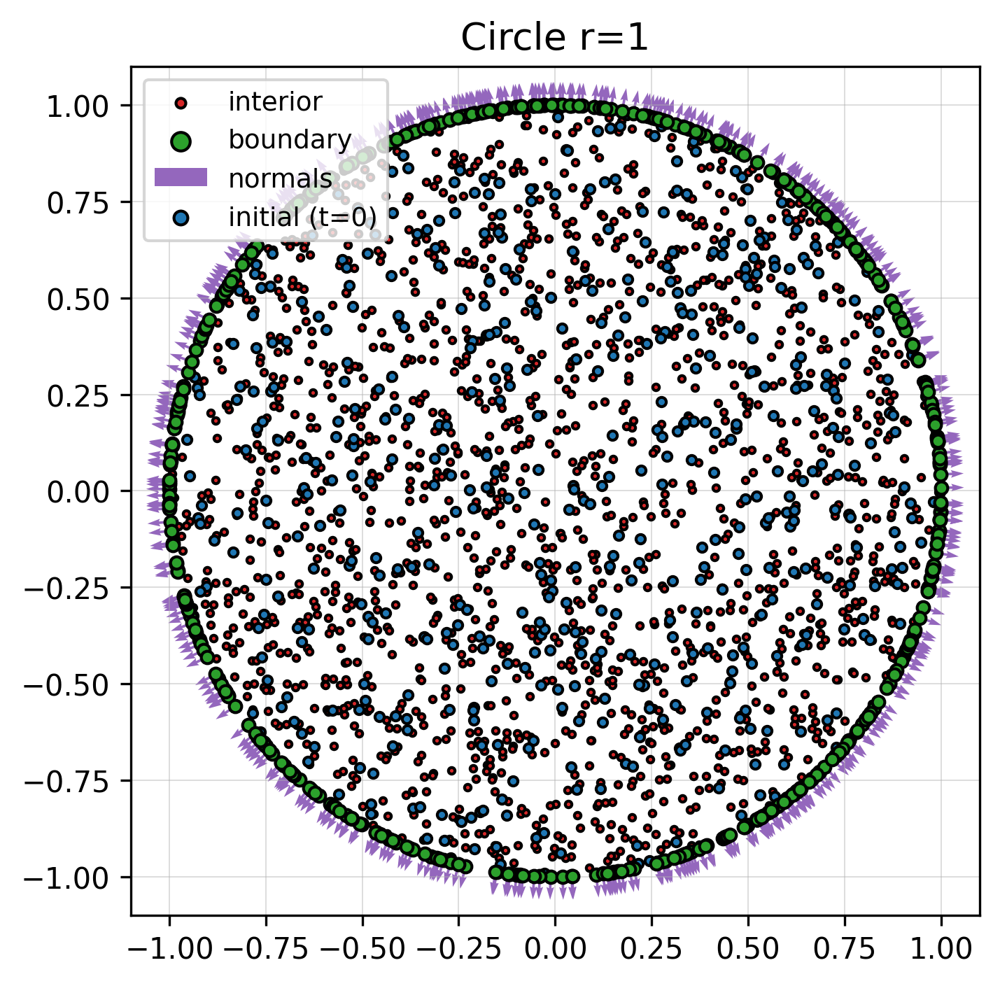

In [3]:
circle_bounds = {
    "outer": {
        "p": [0.0, 1.0],
        "x": lambda p: torch.cos(2 * math.pi * p),
        "y": lambda p: torch.sin(2 * math.pi * p),
    }
}

geo_circle = Geometry(circle_bounds, dim=2, has_time=True, T=[0.0, 1.0])
samp_circle = Sampler(geo_circle, n_interior=1500, n_boundary=500, n_initial=500, strategy="uniform")
pts_circle = samp_circle.sample()

print("interior :", pts_circle.interior.coords.shape)
print("boundary :", pts_circle.boundaries["outer"].coords.shape)

nx = pts_circle.boundaries["outer"].nx
ny = pts_circle.boundaries["outer"].ny
norms = torch.sqrt(nx**2 + ny**2)
print(f"norm of normals: min={norms.min():.4f}  max={norms.max():.4f}  (must be ≈ 1)")

plot_samples(pts_circle, title="Circle r=1")

## Rhombus

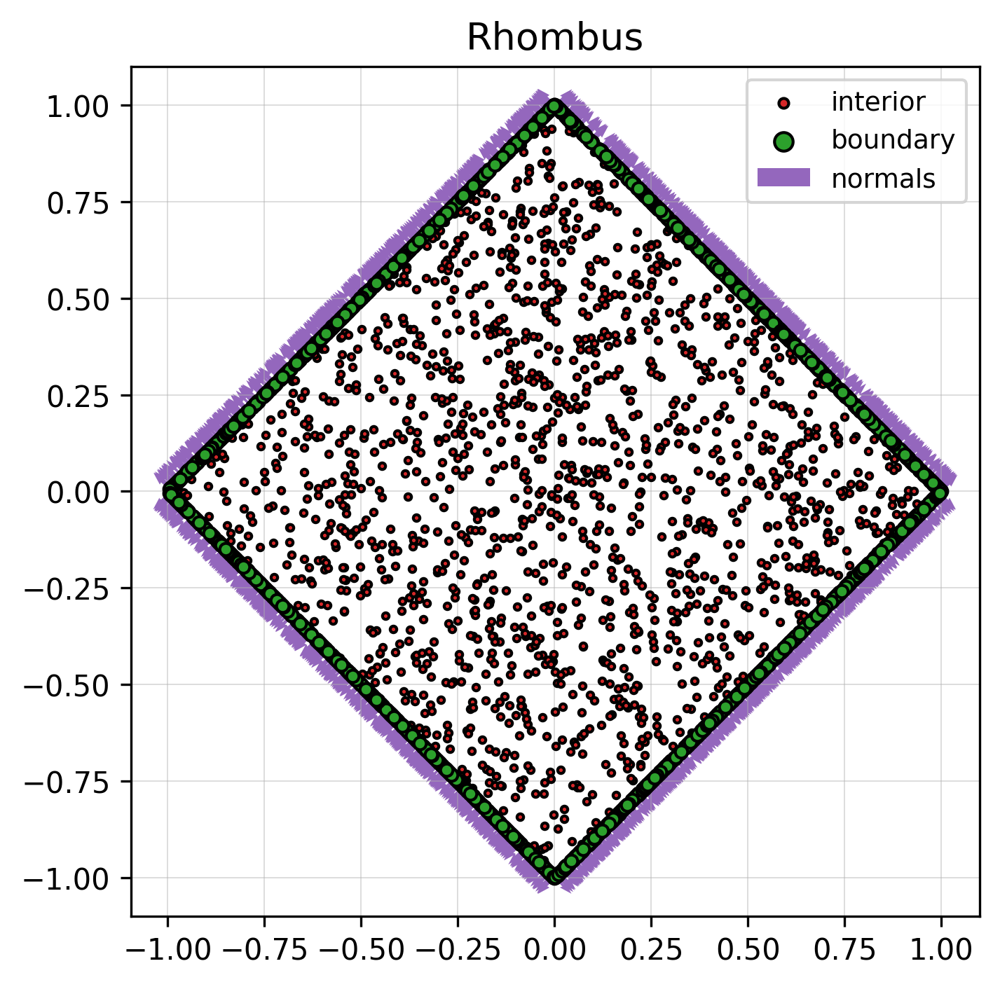

In [4]:
rhombus_bounds = {
    "tr": {"p": [0.0, 1.0], "x": lambda p: 1.0 - p,      "y": lambda p: 0*p + p},
    "tl": {"p": [0.0, 1.0], "x": lambda p: 0*p - p,      "y": lambda p: 1.0 - p},
    "bl": {"p": [0.0, 1.0], "x": lambda p: 0*p + p - 1,  "y": lambda p: 0*p - p},
    "br": {"p": [0.0, 1.0], "x": lambda p: 0*p + p,      "y": lambda p: p - 1.0},
}

geo_rh = Geometry(rhombus_bounds, dim=2, has_time=False)
samp_rh = Sampler(geo_rh, n_interior=1500, n_boundary=500)
pts_rh = samp_rh.sample()

plot_samples(pts_rh, title="Rhombus")

## Ring (0.3 < r < 1)

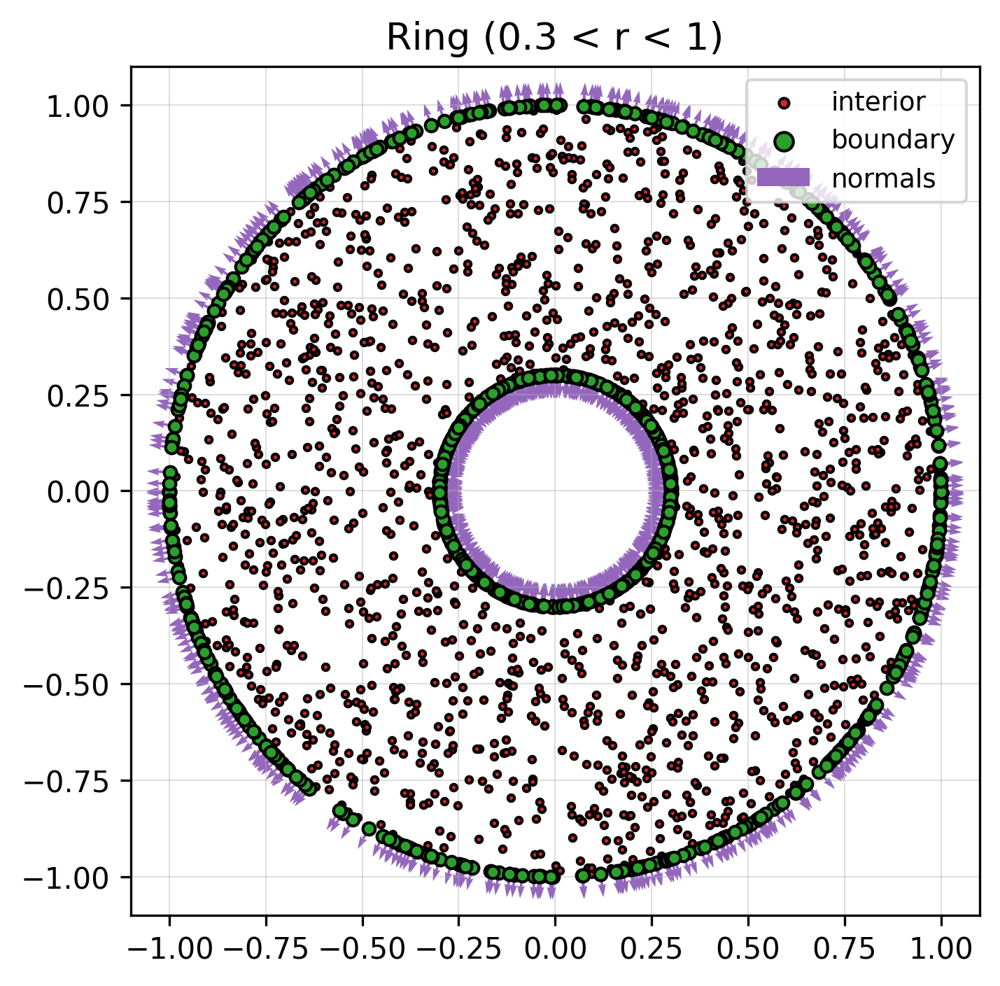

In [5]:
annulus_bounds = {
    "outer": {
        "p": [0.0, 1.0],
        "x": lambda p: torch.cos(2 * math.pi * p),
        "y": lambda p: torch.sin(2 * math.pi * p),
    },
    "inner": {
        "p": [0.0, 1.0],
        "x": lambda p: 0.3 * torch.cos(2 * math.pi * p),
        "y": lambda p: 0.3 * torch.sin(2 * math.pi * p),
    },
}

geo_ann = Geometry(annulus_bounds, dim=2, has_time=False)
samp_ann = Sampler(geo_ann, n_interior=1500, n_boundary=500)
pts_ann = samp_ann.sample()

plot_samples(pts_ann, title="Ring (0.3 < r < 1)")

## L-shaped region (non-convex)

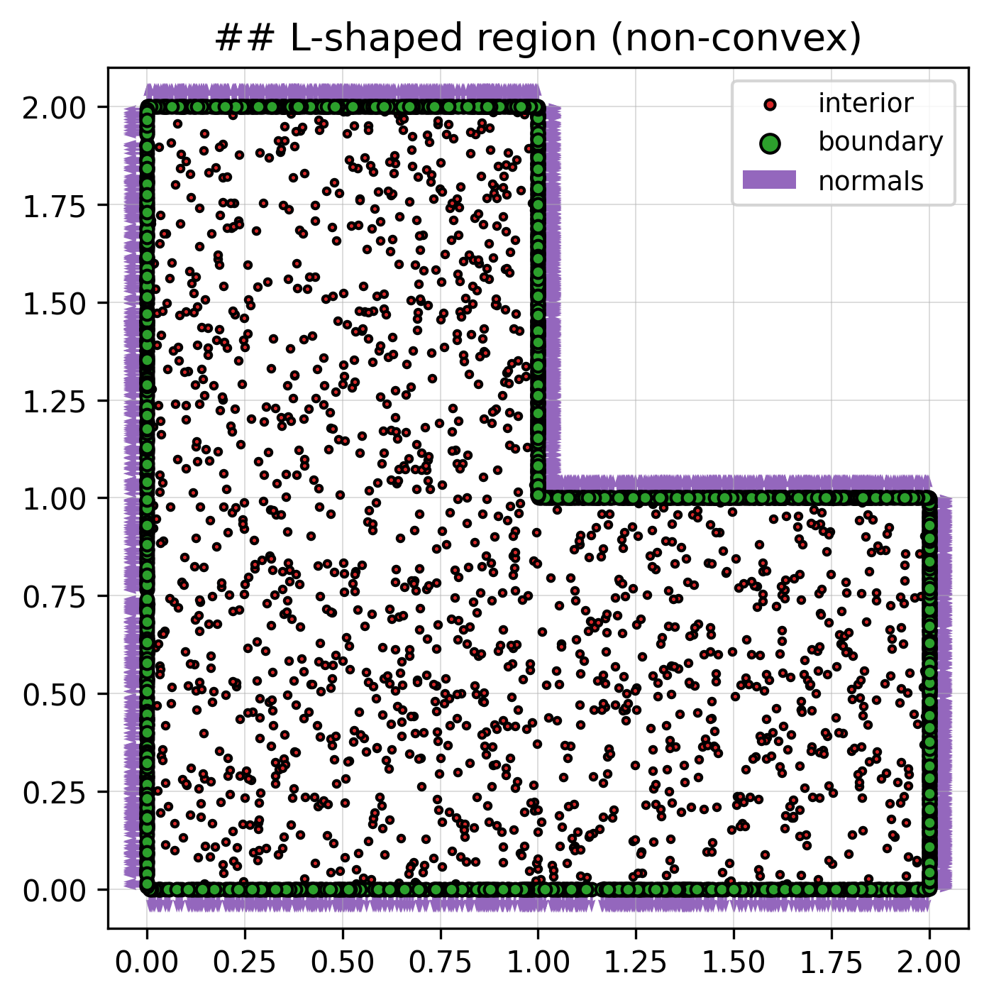

In [ ]:
lshape_bounds = {
    "s1_bottom": {"p": [0.0, 1.0], "x": lambda p: p * 2,   "y": lambda p: 0*p        },
    "s2_right":  {"p": [0.0, 1.0], "x": lambda p: 0*p + 2, "y": lambda p: p          },
    "s3_notch_h":{"p": [0.0, 1.0], "x": lambda p: 2.0 - p, "y": lambda p: 0*p + 1    },
    "s4_notch_v":{"p": [0.0, 1.0], "x": lambda p: 0*p + 1, "y": lambda p: 1.0 + p    },
    "s5_top":    {"p": [0.0, 1.0], "x": lambda p: 1.0 - p, "y": lambda p: 0*p + 2    },
    "s6_left":   {"p": [0.0, 1.0], "x": lambda p: 0*p,     "y": lambda p: 2.0 - p * 2},
}

geo_l = Geometry(lshape_bounds, dim=2, has_time=False)
samp_l = Sampler(geo_l, n_interior=1500, n_boundary=500)
pts_l = samp_l.sample()

plot_samples(pts_l, title="## L-shaped region (non-convex)")

## Ellipse + Time, LHS Strategy

interior : torch.Size([1500, 3])
initial  : torch.Size([500, 3])
t range interior: 0.001 ... 2.000


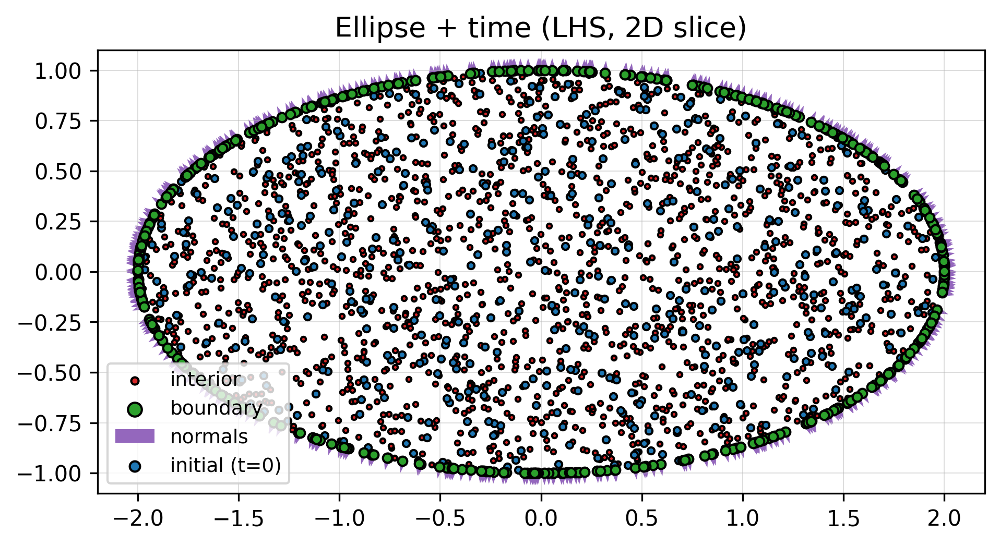

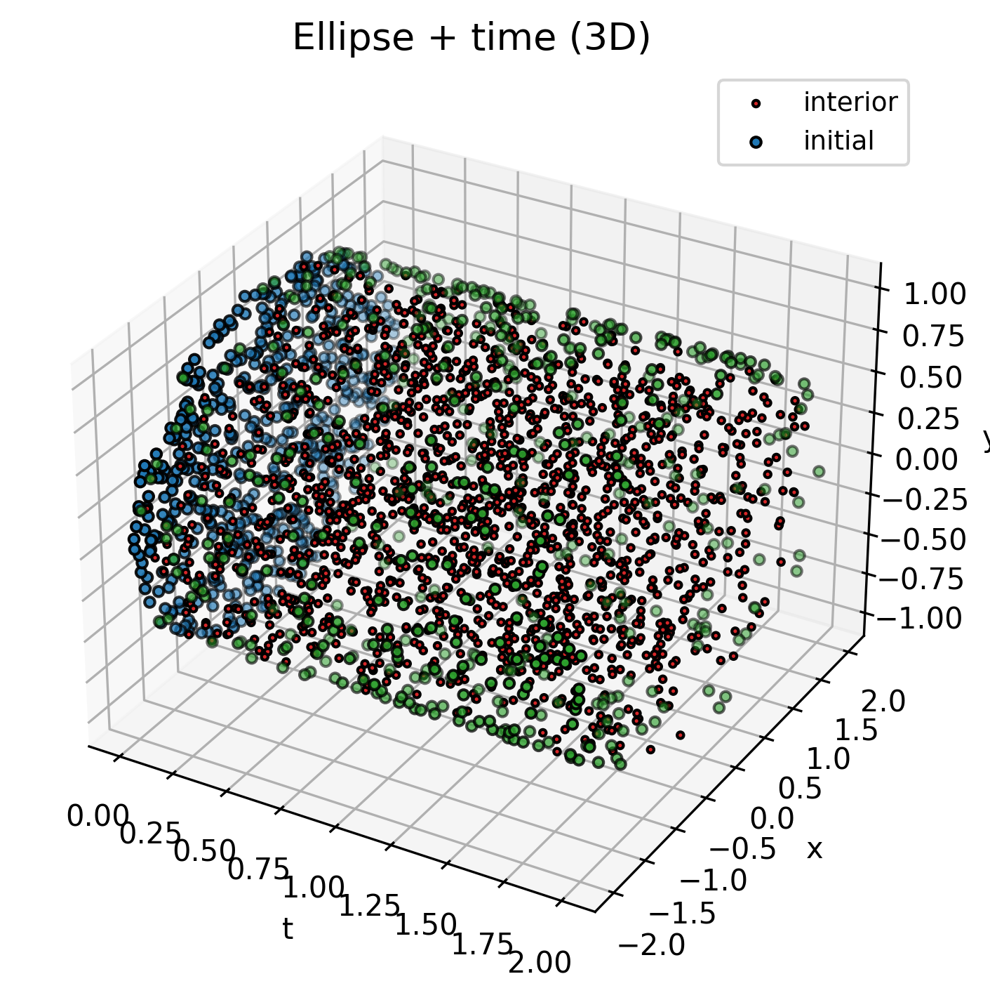

In [8]:
ellipse_bounds = {
    "outer": {
        "p": [0.0, 1.0],
        "x": lambda p: 2.0 * torch.cos(2 * math.pi * p),
        "y": lambda p: 1.0 * torch.sin(2 * math.pi * p),
    }
}

geo_ell = Geometry(ellipse_bounds, dim=2, has_time=True, T=[0.0, 2.0])
samp_ell = Sampler(geo_ell, n_interior=1500, n_boundary=500, n_initial=500, strategy="latin_hypercube")
pts_ell = samp_ell.sample()

print("interior :", pts_ell.interior.coords.shape)
print("initial  :", pts_ell.initial.coords.shape)
print(f"t range interior: {pts_ell.interior.coords[:, 0].min().item():.3f} ... {pts_ell.interior.coords[:, 0].max().item():.3f}")

plot_samples(pts_ell, title="Ellipse + time (LHS, 2D slice)")
plot_samples_3d(pts_ell, title="Ellipse + time (3D)")


## Crescent

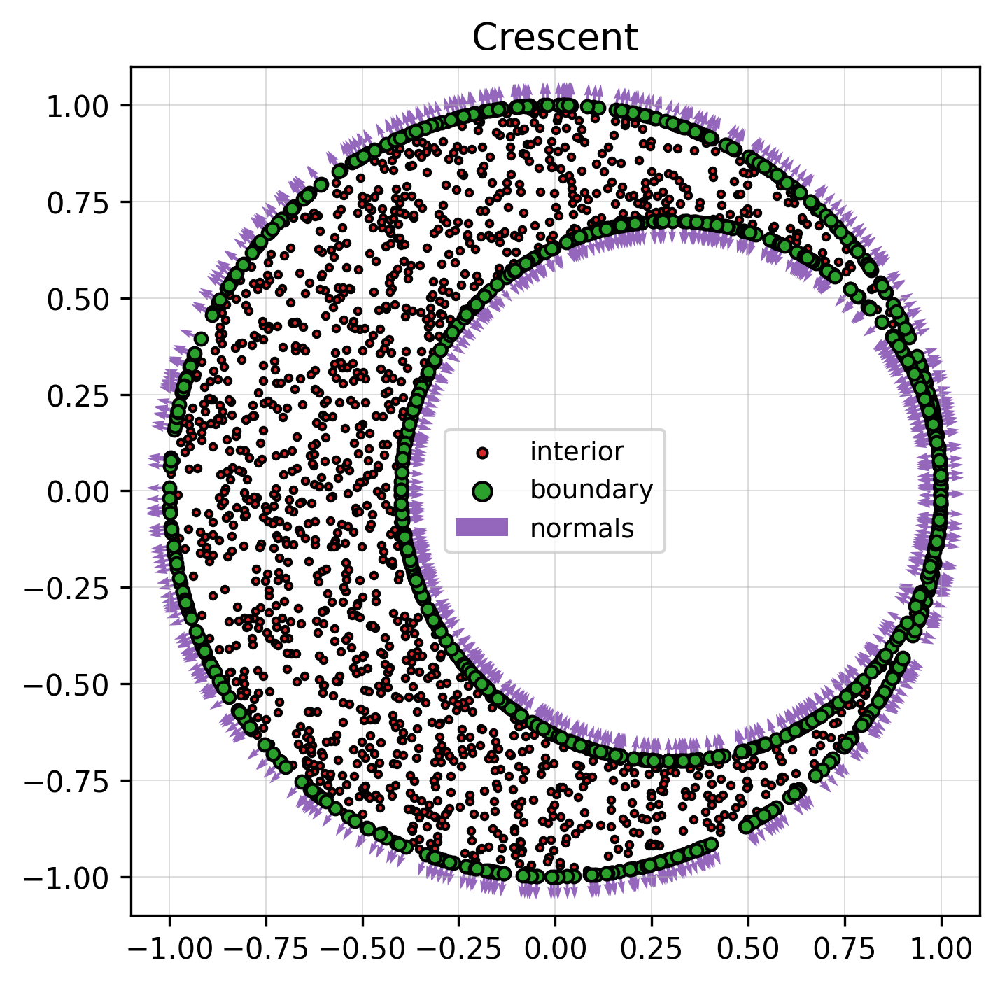

In [9]:
crescent_bounds = {
    "outer": {
        "p": [0.0, 1.0],
        "x": lambda p: torch.cos(2 * math.pi * p),
        "y": lambda p: torch.sin(2 * math.pi * p),
    },
    "inner": {
        "p": [0.0, 1.0],
        "x": lambda p: 0.3 + 0.7 * torch.cos(2 * math.pi * p),
        "y": lambda p: 0.7 * torch.sin(2 * math.pi * p),
    },
}

geo_cr = Geometry(crescent_bounds, dim=2, has_time=False)
samp_cr = Sampler(geo_cr, n_interior=1500, n_boundary=500)
pts_cr = samp_cr.sample()

plot_samples(pts_cr, title="Crescent")

## Limaçon

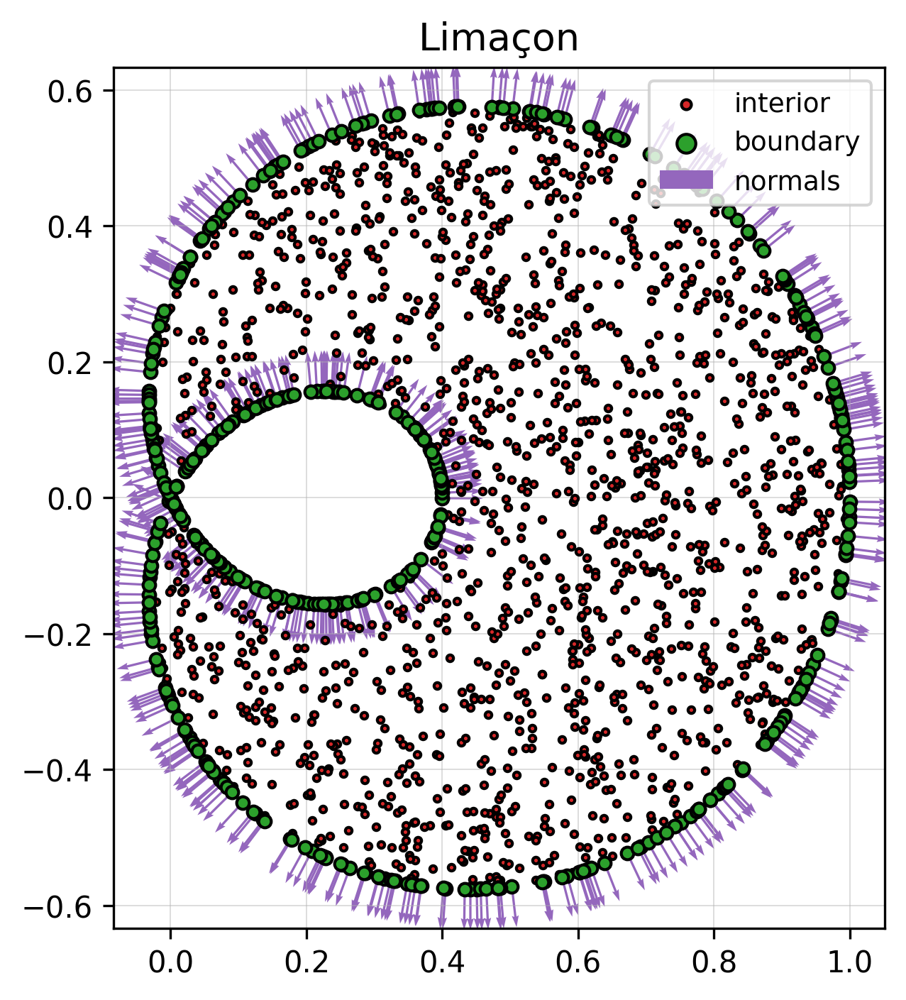

In [10]:
snail_bounds = {
    "outer": {
        "p": [0.0, 1.0],
        "x": lambda p: torch.cos(2*math.pi*p) * (0.3 + 0.7*torch.cos(2*math.pi*p)),
        "y": lambda p: torch.sin(2*math.pi*p) * (0.3 + 0.7*torch.cos(2*math.pi*p)),
    },
}

geo_sn = Geometry(snail_bounds, dim=2, has_time=False)
samp_sn = Sampler(geo_sn, n_interior=1500, n_boundary=500)
pts_sn = samp_sn.sample()

plot_samples(pts_sn, title="Limaçon")

## Star

C:\Users\ilya\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\IPython\core\pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


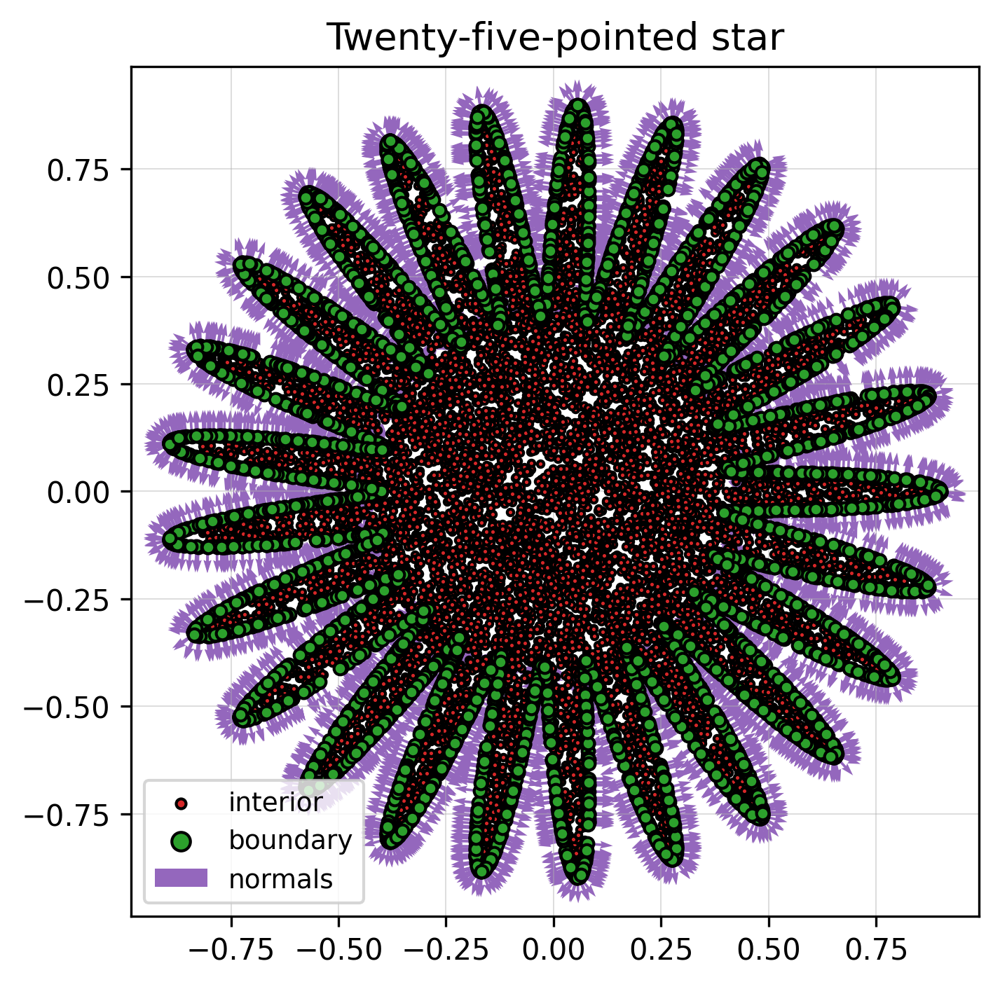

In [11]:
n_points_star = 25

def star_r(p):
    angle = 2 * math.pi * p
    osc = torch.cos(n_points_star * angle)
    return 0.4 + 0.5 * (osc + 1) / 2

star_bounds = {
    "outer": {
        "p": [0.0, 1.0],
        "x": lambda p: star_r(p) * torch.cos(2 * math.pi * p),
        "y": lambda p: star_r(p) * torch.sin(2 * math.pi * p),
    },
}

geo_st = Geometry(star_bounds, dim=2, has_time=False)
samp_st = Sampler(geo_st, n_interior=10000, n_boundary=5000)
pts_st = samp_st.sample()

plot_samples(pts_st, title="Twenty-five-pointed star")

## Cardioid

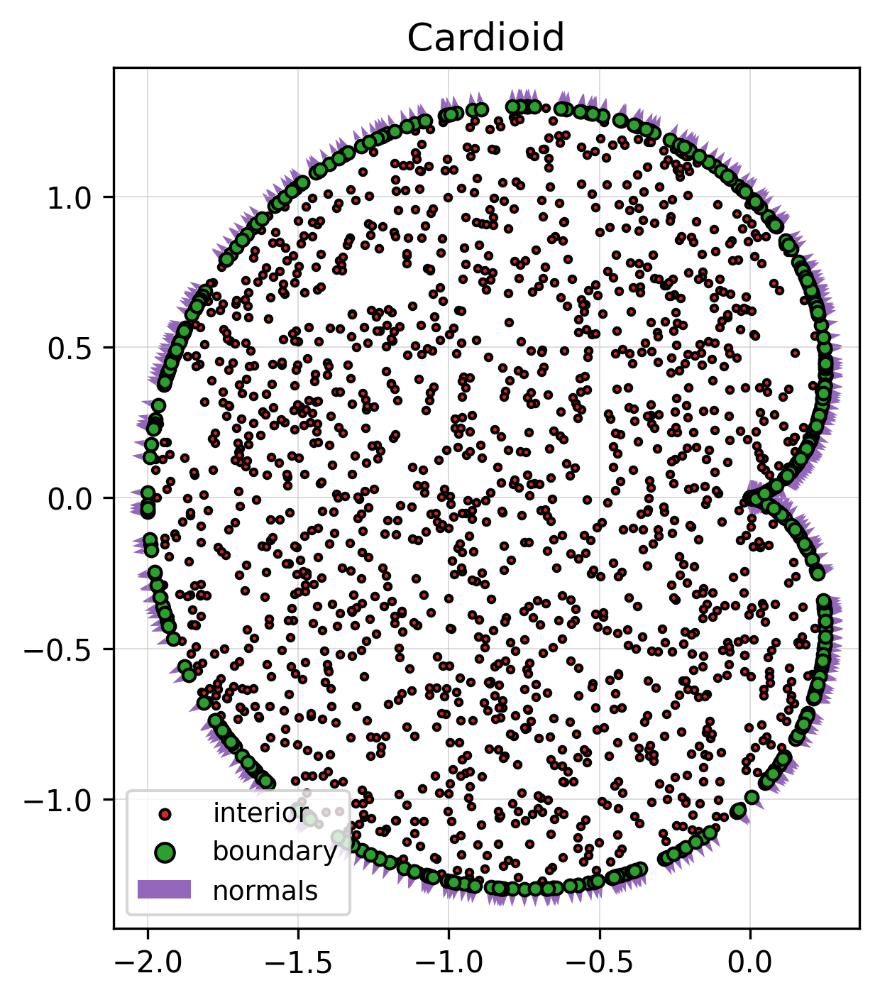

In [12]:
cardio_bounds = {
    "outer": {
        "p": [0.0, 1.0],
        "x": lambda p: (1 - torch.cos(2*math.pi*p)) * torch.cos(2*math.pi*p),
        "y": lambda p: (1 - torch.cos(2*math.pi*p)) * torch.sin(2*math.pi*p),
    },
}

geo_cr = Geometry(cardio_bounds, dim=2, has_time=False)
samp_cr = Sampler(geo_cr, n_interior=1500, n_boundary=500)
pts_cr = samp_cr.sample()

plot_samples(pts_cr, title="Cardioid")

## Star of David

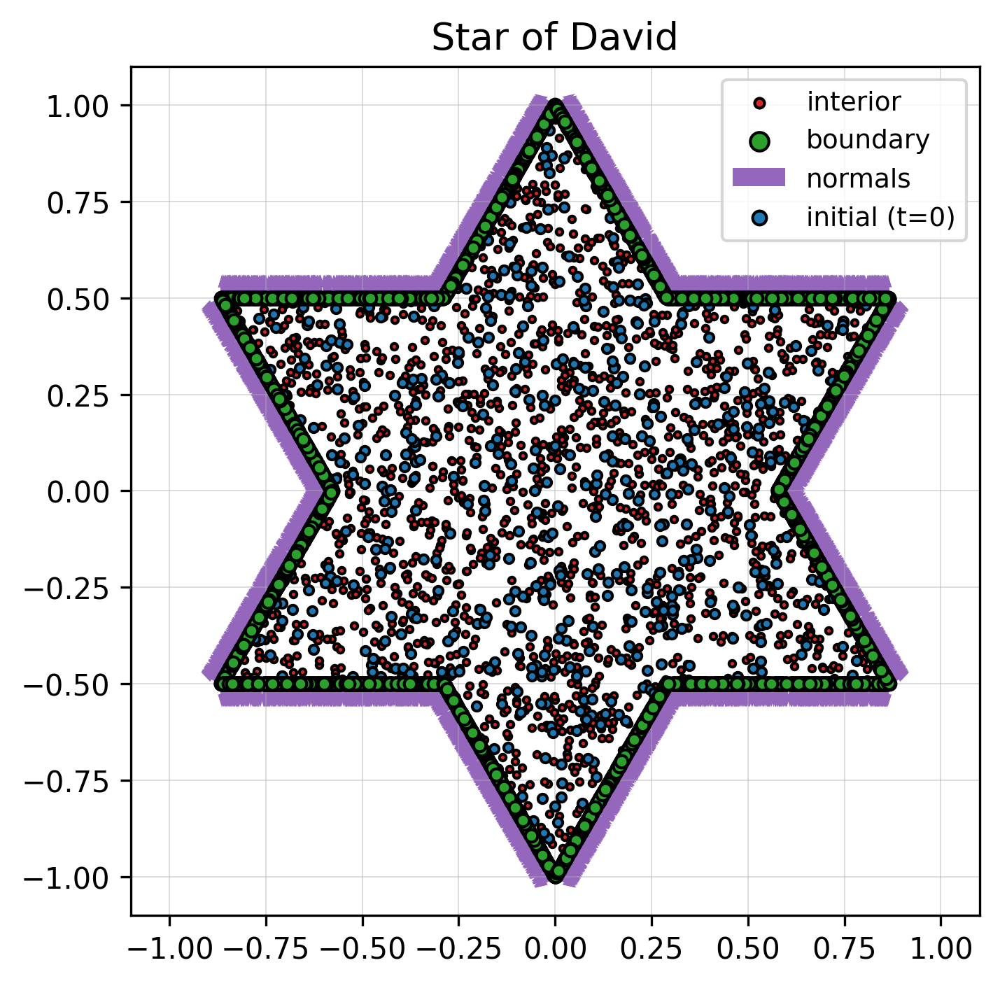

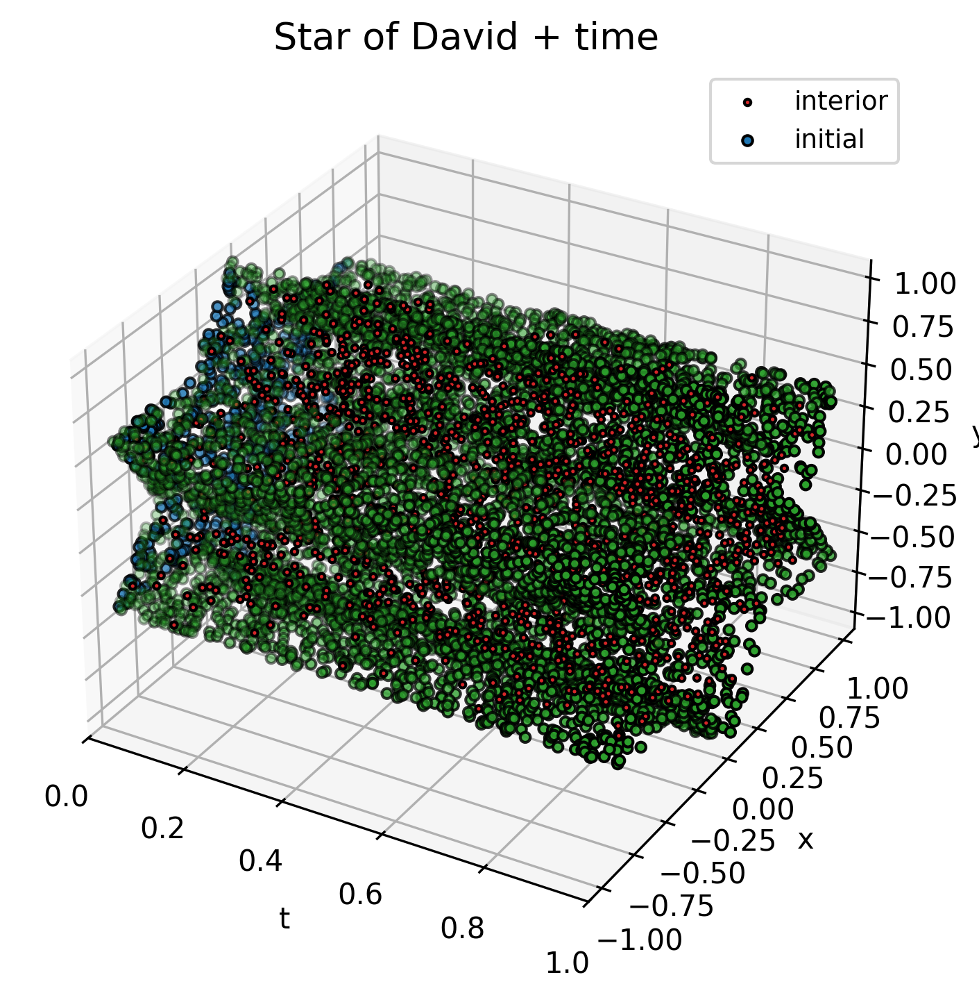

In [13]:
r_outer = 1.0
r_inner = r_outer / math.sqrt(3)

vertices = []
for i in range(6):
    angle_out = math.pi / 2 + i * math.pi / 3
    vertices.append((r_outer * math.cos(angle_out), r_outer * math.sin(angle_out)))
    angle_in = math.pi / 2 + math.pi / 6 + i * math.pi / 3
    vertices.append((r_inner * math.cos(angle_in), r_inner * math.sin(angle_in)))

star_bounds = {}
n = len(vertices)
for i in range(n):
    x0, y0 = vertices[i]
    x1, y1 = vertices[(i + 1) % n]
    def make_bound(xa, ya, xb, yb):
        return {
            "p": [0.0, 1.0],
            "x": lambda p, xa=xa, xb=xb: xa * (1-p) + xb * p,
            "y": lambda p, ya=ya, yb=yb: ya * (1-p) + yb * p,
        }
    star_bounds[f"s{i}"] = make_bound(x0, y0, x1, y1)

geo_star = Geometry(star_bounds, dim=2, has_time=True, T=[0.0, 1.0])
samp_star = Sampler(geo_star, n_interior=1500, n_boundary=500)
pts_star = samp_star.sample()

lim = 1.1
plot_samples(pts_star, title="Star of David", xlim=(-lim, lim), ylim=(-lim, lim))
plot_samples_3d(pts_star, title="Star of David + time", xlim=(0,1), ylim=(-lim, lim), zlim=(-lim, lim))

## Star of David in a circle

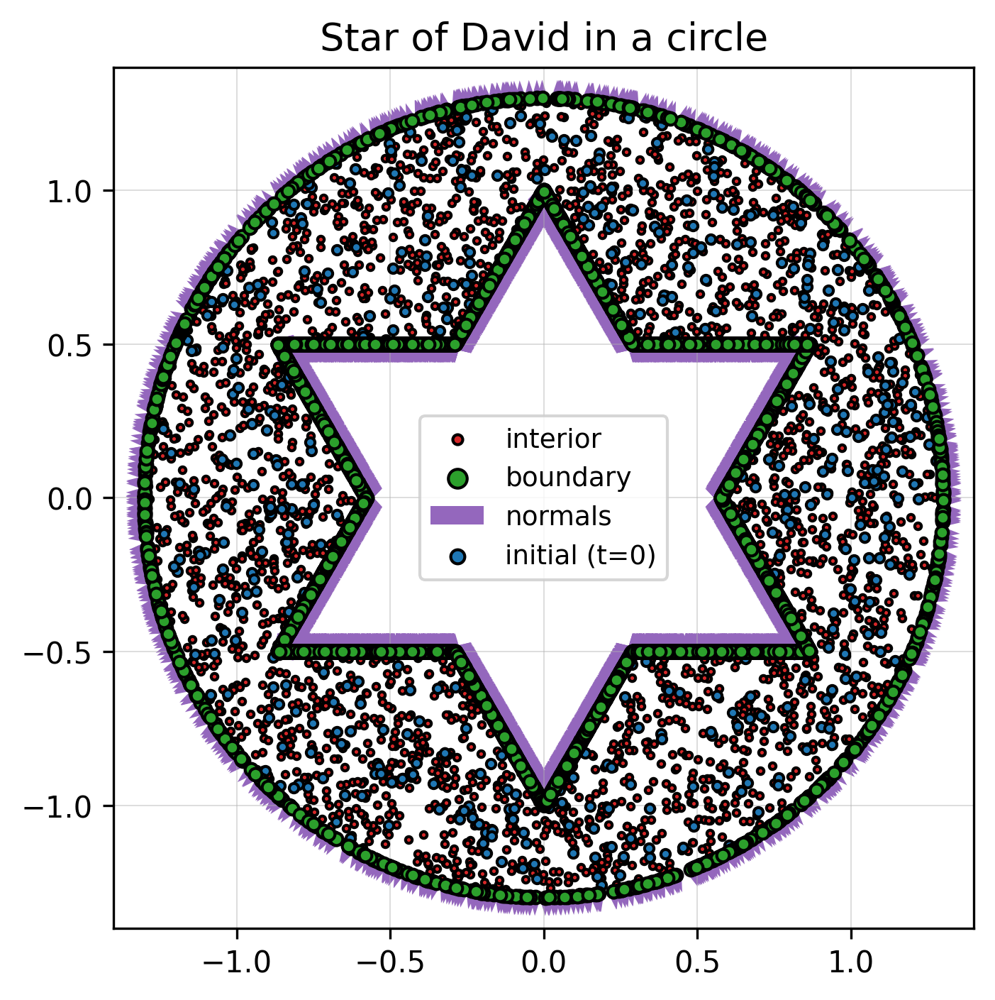

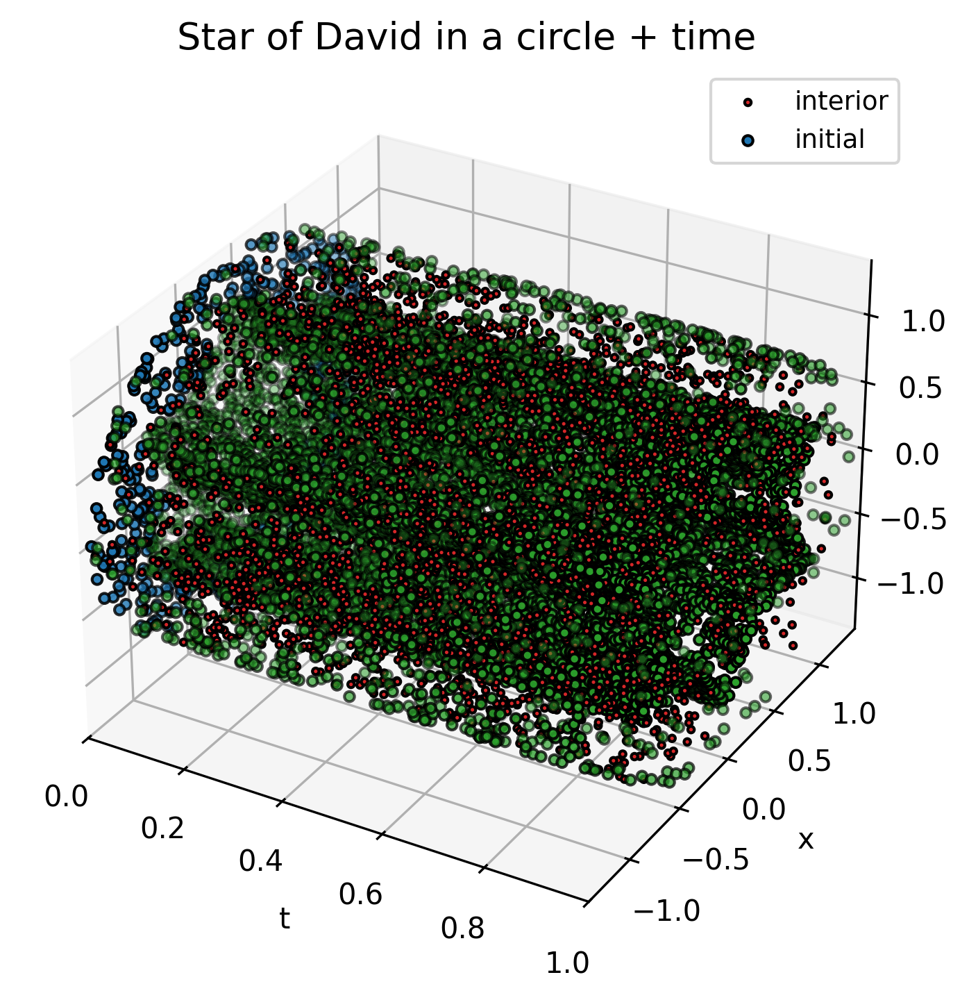

In [14]:
r_outer = 1.0
r_inner = r_outer / math.sqrt(3)
r_circle = 1.3

vertices = []
for i in range(6):
    angle_out = math.pi / 2 + i * math.pi / 3
    vertices.append((r_outer * math.cos(angle_out), r_outer * math.sin(angle_out)))
    angle_in = math.pi / 2 + math.pi / 6 + i * math.pi / 3
    vertices.append((r_inner * math.cos(angle_in), r_inner * math.sin(angle_in)))

star_bounds = {}
n = len(vertices)
for i in range(n):
    x0, y0 = vertices[i]
    x1, y1 = vertices[(i + 1) % n]
    def make_bound(xa, ya, xb, yb):
        return {
            "p": [0.0, 1.0],
            "x": lambda p, xa=xa, xb=xb: xa * (1-p) + xb * p,
            "y": lambda p, ya=ya, yb=yb: ya * (1-p) + yb * p,
        }
    star_bounds[f"s{i}"] = make_bound(x0, y0, x1, y1)

star_bounds["circle"] = {
    "p": [0.0, 1.0],
    "x": lambda p: r_circle * torch.cos(2 * math.pi * p),
    "y": lambda p: r_circle * torch.sin(2 * math.pi * p),
}

geo_star = Geometry(star_bounds, dim=2, has_time=True, T=[0.0, 1.0])
samp_star = Sampler(geo_star, n_interior=2500, n_boundary=1000)
pts_star = samp_star.sample()

lim = r_circle + 0.1
plot_samples(pts_star, title="Star of David in a circle", xlim=(-lim, lim), ylim=(-lim, lim))
plot_samples_3d(pts_star, title="Star of David in a circle + time", xlim=(0,1), ylim=(-lim, lim), zlim=(-lim, lim))

## Comparison of Uniform vs. LHS on the Circle

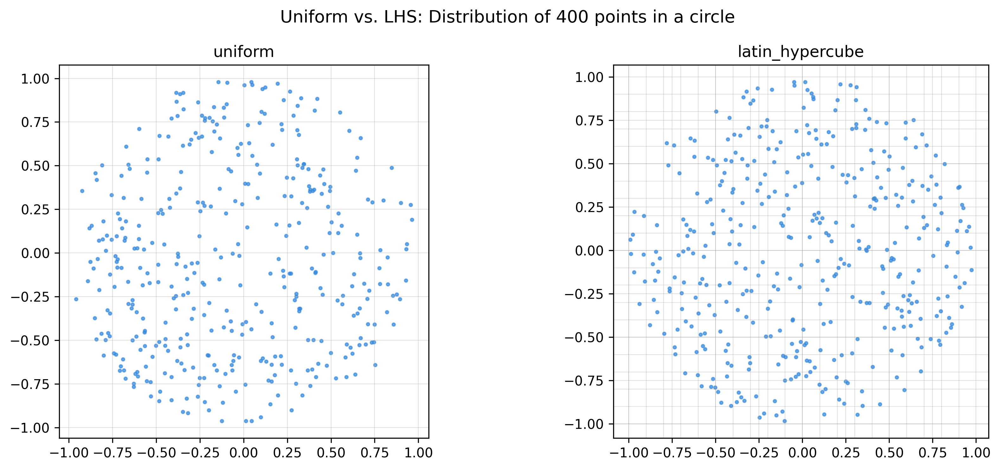

In [15]:
import matplotlib.pyplot as plt

fig, axes = plt.subplots(1, 2, figsize=(12, 5), dpi=300)

for ax, strat in zip(axes, ["uniform", "latin_hypercube"]):
    samp = Sampler(geo_circle, n_interior=400, n_boundary=0, strategy=strat)
    pts  = samp.sample()
    c    = pts.interior.coords.numpy()
    ax.scatter(c[:, -1], c[:, -2], s=5, alpha=0.7, color="#378ADD")
    ax.set_title(strat, fontsize=12)
    ax.set_aspect("equal")
    ax.grid(True, linewidth=0.4, alpha=0.5)

    if strat == "latin_hypercube":
        n = 20
        for i in range(n):
            ax.axvline(-1 + i*2/n, color="gray", linewidth=0.3, alpha=0.4)
            ax.axhline(-1 + i*2/n, color="gray", linewidth=0.3, alpha=0.4)

plt.suptitle("Uniform vs. LHS: Distribution of 400 points in a circle", fontsize=13)
plt.tight_layout()
plt.show()


## Normal check: dot(n, tangent) ≈ 0

In [16]:
bound = circle_bounds["outer"]
p = torch.linspace(0.0, 1.0, 200)[:-1]

nx, ny = geo_circle.compute_normal(bound, p)

dp = 1e-4
x0 = bound["x"](p);       y0 = bound["y"](p)
x1 = bound["x"](p + dp);  y1 = bound["y"](p + dp)
tx = (x1 - x0).detach();  ty = (y1 - y0).detach()

dot = (tx * nx[:, 0] + ty * ny[:, 0]).abs()
print(f"max |dot(n, t)| = {dot.max().item():.2e}  (must be ≈ 0)")
print(f"mean             = {dot.mean().item():.2e}")


max |dot(n, t)| = 2.59e-07  (must be ≈ 0)
mean             = 1.96e-07
